<a href="https://colab.research.google.com/github/val0tus/Machine-Learning/blob/master/Convolutional_autoencoder_fashion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Harri Valkonen 1908151

In [0]:
%tensorflow_version 1.14

`%tensorflow_version` only switches the major version: 1.x or 2.x.
You set: `1.14`. This will be interpreted as: `1.x`.


TensorFlow 1.x selected.


In [0]:
import keras
keras.__version__

from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D
from keras.models import Model
from keras import backend as K
from keras.datasets import mnist
from keras.layers import Input, Dense
from keras.models import Model

Using TensorFlow backend.


In [0]:
(x_train, _), (x_test, y_test) = keras.datasets.fashion_mnist.load_data()

x_train = x_train.astype('float32') / 255.
x_train = x_train.reshape(x_train.shape + (1,))
x_test = x_test.astype('float32') / 255.
x_test = x_test.reshape(x_test.shape + (1,))

# Print the data set dimensions
print('x_train shape: {}'.format(x_train.shape))
print('x_test shape: {}'.format(x_test.shape))

x_train shape: (60000, 28, 28, 1)
x_test shape: (10000, 28, 28, 1)


In [0]:
input_img = Input(shape=(28, 28, 1))  # adapt this if using `channels_first` image data format

x = Conv2D(16, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
encoded = MaxPooling2D((2, 2), padding='same')(x)

# at this point the representation is (4, 4, 8) i.e. 128-dimensional

x = Conv2D(8, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(16, (3, 3), activation='relu')(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adadelta', loss='binary_crossentropy')

In [0]:
import numpy as np

x_train = np.reshape(x_train, (len(x_train), 28, 28, 1))  # adapt this if using `channels_first` image data format
x_test = np.reshape(x_test, (len(x_test), 28, 28, 1))  # adapt this if using `channels_first` image data format

In [0]:
#Delete old logs
!rm -rf ./logs/ 

In [0]:
from keras.callbacks import TensorBoard
import datetime

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

autoencoder.fit(x_train, x_train,
                epochs=50,
                batch_size=128,
                shuffle=True,
                validation_data=(x_test, x_test),
                callbacks=[tensorboard_callback])

Train on 60000 samples, validate on 10000 samples
Epoch 1/50
60000/60000 [==============================] - 84s 1ms/step - loss: 0.3163 - val_loss: 0.3181
Epoch 2/50
60000/60000 [==============================] - 82s 1ms/step - loss: 0.3158 - val_loss: 0.3087
Epoch 3/50
60000/60000 [==============================] - 82s 1ms/step - loss: 0.3136 - val_loss: 0.3087
Epoch 4/50
60000/60000 [==============================] - 83s 1ms/step - loss: 0.3124 - val_loss: 0.3048
Epoch 5/50
60000/60000 [==============================] - 86s 1ms/step - loss: 0.3127 - val_loss: 0.3166
Epoch 6/50
60000/60000 [==============================] - 83s 1ms/step - loss: 0.3122 - val_loss: 0.3261
Epoch 7/50
60000/60000 [==============================] - 86s 1ms/step - loss: 0.3111 - val_loss: 0.3040
Epoch 8/50
60000/60000 [==============================] - 84s 1ms/step - loss: 0.3110 - val_loss: 0.3147
Epoch 9/50
60000/60000 [==============================] - 84s 1ms/step - loss: 0.3109 - val_loss: 0.3113
Epoch

In [0]:
import os
logs_base_dir = "logs/fit"
os.makedirs(logs_base_dir, exist_ok=True)
%tensorboard --logdir {logs_base_dir}

<IPython.core.display.Javascript object>

Original


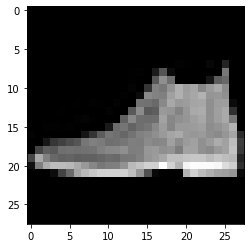

Generated


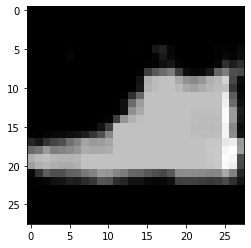

Original


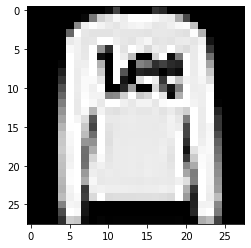

Generated


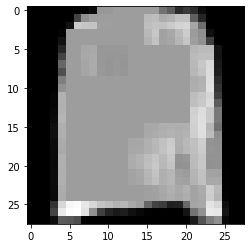

Original


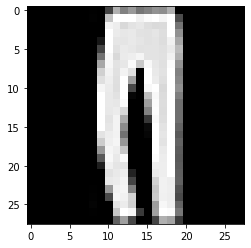

Generated


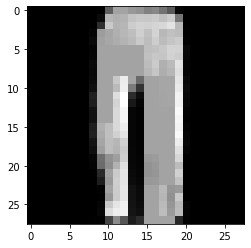

Original


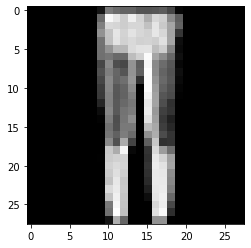

Generated


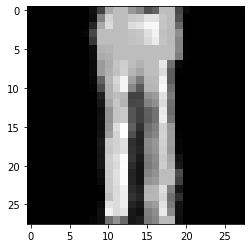

Original


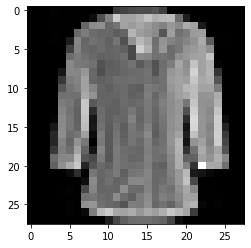

Generated


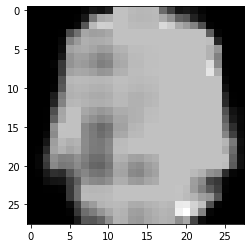

Original


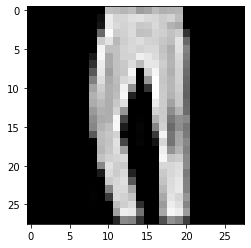

Generated


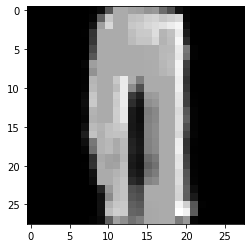

Original


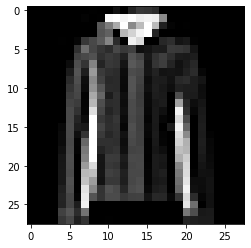

Generated


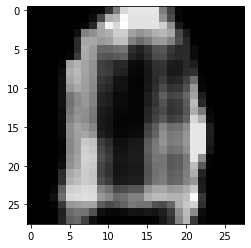

Original


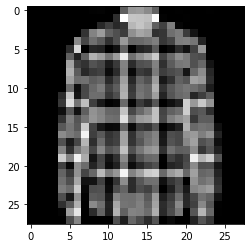

Generated


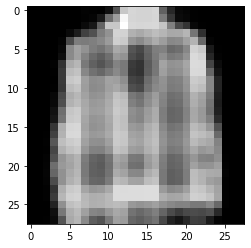

Original


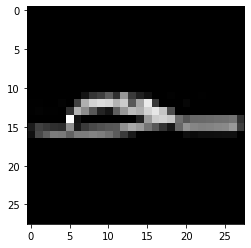

Generated


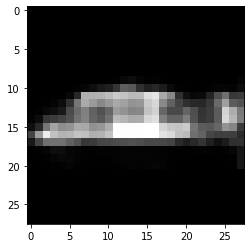

Original


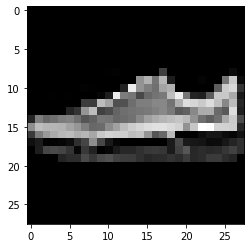

Generated


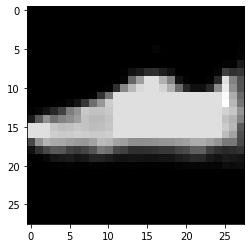

In [53]:
import matplotlib.pyplot as plt

decoded_imgs = autoencoder.predict(x_test)

for i in range(10):

  print('Original')
  plt.imshow(x_test[i].reshape(28, 28))
  plt.show()
  print('Generated')
  plt.imshow(decoded_imgs[i].reshape(28, 28))
  plt.show()

# New Section